# Import

In [1]:
import torch 
### 토치확인
print("pytorch cuda 여부")
print(torch.cuda.is_available())
print('#'*50)

from tensorflow.python.client import device_lib
print("tensorflow cuda 여부")
print(device_lib.list_local_devices())
print('#'*50)

import os
os.environ["CUDA_VISIBLE_DEVICES"]="0" # -1이면 cpu사용

pytorch cuda 여부
True
##################################################
tensorflow cuda 여부
[name: "/device:CPU:0"
device_type: "CPU"
memory_limit: 268435456
locality {
}
incarnation: 9370452201840845551
xla_global_id: -1
, name: "/device:GPU:0"
device_type: "GPU"
memory_limit: 5748293632
locality {
  bus_id: 1
  links {
  }
}
incarnation: 17463437299997961138
physical_device_desc: "device: 0, name: NVIDIA GeForce RTX 3060 Ti, pci bus id: 0000:01:00.0, compute capability: 8.6"
xla_global_id: 416903419
]
##################################################


In [2]:
import os
import numpy as np
import pandas as pd
from datetime import datetime, timedelta
from math import sqrt

import matplotlib
import seaborn as sns
import matplotlib.pyplot as plt
plt.style.use(["seaborn-v0_8-muted"])
seaborn_style = [style for style in matplotlib.style.available if "seaborn" in style]
import plotly.graph_objects as go

from pycaret.regression import *
from pycaret.regression import load_model
import lightgbm as lgb

from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = 'all'
import warnings
warnings.filterwarnings(action='ignore')

from sklearn.metrics import mean_squared_error

# Personal function

## Create train_set

In [3]:
def create_lagged_dataset(input_data, lead_minutes):
    """
    선행시간에 따라 데이터셋을 shift 해주는 함수

    Parameters:
    - input_data: 원본 데이터 
    - lag_minutes: 선행시간 

    Return:
    - X_lagged: 선행시간 만큼 shift
    - y_lagged: Lagged target values
    """
    
    # target을 제외한 행들을 선행시간만큼 미룸(선행시간 lag_minutes까지의 데이터로 예측하기 위함.)
    X_lagged = input_data.drop(columns=['wl_jamsu']).shift(lead_minutes//10)

    y_lagged = input_data['wl_jamsu'].iloc[lead_minutes//10:]

    X_lagged = X_lagged.iloc[lead_minutes//10:]

    return X_lagged, y_lagged

In [4]:
def prepare_datasets_all(input_data, start_year, end_year, lead_minutes):
    """
    전체 월로 학습시키는 데이터 셋 생성 함수,

    Parameters:
    - input_data: 원본 데이터 
    - start_year: 학습 데이터 시작일
    - end_year: 검증 데이터 시작일
    - lead_minutes: 선행시간

    Returns:
    - X_train: 학습 데이터 features
    - y_train: 학습 데이터 target
    - X_test: 검증 데이터 features
    - y_test: 검증 데이터 target
    """
    
    # 선행시간 만큼 train set의 시작점을 미뤄줌
    # ex 선행시간 10분일 때 01:00의 target을 예측하기위해서, 00:50분의 feature가 필요
    train_start_adjusted = pd.Timestamp(f"{start_year}-01-01 00:00:00") - pd.Timedelta(minutes=10)
    train_data = input_data[train_start_adjusted:f"{end_year-1}-12-31 23:50:00"]
    test_data = input_data[f"{end_year}"]

    X_train, y_train = create_lagged_dataset(train_data, lead_minutes)
    X_test, y_test = create_lagged_dataset(test_data, lead_minutes)

    return (X_train, y_train, X_test, y_test)

In [5]:
def create_datasets_part(input_data, start_year, end_year, lead_minutes, months_set_1,months_set_2):
    """
    특정 월로 학습시키는 데이터 셋 생성 함수

    Parameters:
    - input_data: 원본 데이터 
    - start_year: 학습 데이터 시작일
    - end_year: 검증 데이터 시작일
    - lead_minutes: 선행시간
    - months_set_1: 첫번째 데이터셋의 월 구성
    - months_set_2: 두번째 데이터셋의 월 구성

    Returns:
    - X_train_1, y_train_1, X_test_1, y_test_1: 1-6, 11, 12 월로 구성된 학습, 검정 데이터 셋 
    - X_train_2, y_train_2, X_test_2, y_test_2: 7-10 월로 구성된 학습, 검정 데이터셋 
    """

    train_data = input_data[str(start_year):str(end_year-1)]
    test_data = input_data[str(end_year)]

    train_data_set_1 = train_data[train_data.index.month.isin(months_set_1)]
    test_data_set_1 = test_data[test_data.index.month.isin(months_set_1)]

    train_data_set_2 = train_data[train_data.index.month.isin(months_set_2)]
    test_data_set_2 = test_data[test_data.index.month.isin(months_set_2)]

    X_train_1, y_train_1 = create_lagged_dataset(train_data_set_1, lead_minutes)
    X_test_1, y_test_1 = create_lagged_dataset(test_data_set_1, lead_minutes)

    X_train_2, y_train_2 = create_lagged_dataset(train_data_set_2, lead_minutes)
    X_test_2, y_test_2 = create_lagged_dataset(test_data_set_2, lead_minutes)

    return (X_train_1, y_train_1, X_test_1, y_test_1), (X_train_2, y_train_2, X_test_2, y_test_2)


## Evaluate pred_result

In [6]:
def feature_importance(leadtime, max_n):
    """
    lgbm 모델의 feature importance를 불러오는 함수.
    final_model-1 기준으로 불러오게 되어있으나, 1~3까지로 수정 가능. 
    """
    model = load_model(f'../model/leadtime({leadtime})/final_model-1').steps[-1][1]
    importance = lgb.plot_importance(model, max_num_features=max_n, figsize=(6, 4), ax=ax)
    ax.set_title(f'Leadtime {leadtime} Feature Importance',fontsize=15)
    return 0

In [7]:
def plot_compare(answer_data,pred_data):
    """
    실제 데이터와 예측 데이터를 비교하는 함수
    1. scatter plot
    2. line plot
    """
    
    # 오차(rmse) 계산
    rmse = mean_squared_error(answer_data['wl_jamsu'], pred_data['pred_wl_jamsu'], squared=False)

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 7))

    # Scatter plot
    ax1.scatter(answer_data['wl_jamsu'], pred_data['pred_wl_jamsu'])
    ax1.set_xlabel('x')
    ax1.set_ylabel('y')
    ax1.set_title('Actual vs. Predicted Water Levels')
    ax1.set_aspect('equal', adjustable='box')

    # Line plot
    ax2.text(0.05, 0.95, '  {:.3f}  '.format(rmse),fontsize=30, ha='right', va='top', transform=ax2.transAxes)
    ax2.plot(answer_data.index, answer_data['wl_jamsu'], label='Actual', color='blue', alpha=0.5)
    ax2.plot(answer_data.index, pred_data['pred_wl_jamsu'], label='Predicted', color='red', linestyle='--', alpha=0.5)
    ax2.set_xlabel('Time')
    ax2.set_ylabel('Water Level')
    ax2.set_title('Actual vs. Predicted Water Levels')
    ax2.legend()
    ax2.grid(True)

    plt.tight_layout()
    plt.show()

In [8]:
def plot_month(answer_data,pred_data,len_m):
    """
    1. scatter plot: 실제 데이터와 예측 데이터의 오차를 월별로 보여주는 함수
    2. bar plot: 예측 데이터의 오차를 월별로 보여주는 함수 
    
    """
    
    used_data=pd.concat([answer_data,pred_data],axis=1)
    used_data.index=pd.to_datetime(used_data.index)

    grouped = used_data.groupby(used_data.index.month)
    year = used_data.index[0].year

    fig, axes = plt.subplots(nrows=len_m//2, ncols=2, figsize=(20, len_m*2))
    axes = axes.ravel()  
    month_names = ["January", "February", "March", "April", "May", "June", "July", "August", 
                "September", "October", "November", "December"]

    month_rmse = []
    
    # Line plot
    for (month, m_data), ax in zip(grouped, axes):
        actual = m_data['wl_jamsu']
        predicted = m_data['pred_wl_jamsu']
        
        rmse = mean_squared_error(actual, predicted, squared=False)
        month_rmse.append(rmse)
        
        ax.plot(m_data.index, actual, label='Actual', color='blue', alpha=0.5)
        ax.plot(m_data.index, predicted, label='Predicted', color='red', linestyle='--', alpha=0.5)
        ax.set_title(f'{month_names[month-1]}, {year} - RMSE: {rmse:.2f}')
        ax.set_xlabel('Time')
        ax.set_ylabel('Water Level')
        ax.legend()
        ax.grid(True)

    plt.tight_layout()
    plt.show();
    
    # Bar plot
    plt.figure(figsize=(10, 6))
    plt.bar(range(len(month_rmse)), month_rmse, color='skyblue', edgecolor='black')
    plt.ylabel('RMSE')
    plt.xlabel('Month')
    plt.title(f'RMSE by Month for {year}')
    plt.xticks(range(len(month_rmse)), [month_names[i-1] for i in grouped.groups.keys()], rotation=45)
    plt.grid(axis='y')
    plt.tight_layout()
    plt.show();


## Final_pred 

In [9]:
def make_model(data,leadtime,n):
    """
    eda 및 feature engineering이 완료된 이후, 
    선행시간 별 모델 학습 및 예측을 위한 함수 
    
    모델 생성. 

    """
    train=pd.concat([data[0],data[1]],axis=1)
    test=pd.concat([data[2],data[3]],axis=1)
    
    setups = setup(data=train, test_data = test, target='wl_jamsu', 
                fold_strategy = 'kfold',fold=5, data_split_shuffle=True, 
                remove_outliers= False, transformation=False, session_id=624, use_gpu=True,verbose=False)
    
    model= create_model('lightgbm',verbose=False)
    model_tuned = tune_model(model,choose_better = True,search_library = 'optuna',verbose=False)
    os.makedirs(f"../model/leadtime({leadtime})",exist_ok=True)
    save_model(model_tuned, f'../model/leadtime({leadtime})/final_model-{n}')

    return 0

In [10]:
def get_model_input(data, lead_time_minutes):
    
    # 특정 시점의 데이터를 예측하기 위한, 학습 데이터 준비 
    start_time = datetime(2023, 1, 1) - timedelta(minutes=lead_time_minutes)
    
    input_data = data[data.index >= start_time.strftime('%Y-%m-%d %H:%M:%S')]
    
    input_data.drop(['wl_jamsu'],axis=1,inplace=True)
    
    return input_data

In [11]:
def make_pred(data,leadtime, n):
    
    """
    모델 3개를 이용하여 각각 학습, 예측한 후
    특정 모델에서 특정 월의 결과를 가져오는 함수. 
    """
    
    # 모델에서 어떤 월을 가져올지. 
    selected_months = [[3, 4, 5, 6, 11, 12,8,9,10],[1,2],[7]]
    
    input_data = get_model_input(data, leadtime)
    model = load_model(f'../model/leadtime({leadtime})/final_model-{n}') 
    y_pred = model.predict(input_data,verbose=0)
    y_pred=pd.DataFrame(y_pred[:-(leadtime//10)],index=answer.index)
    
    y_pred.to_csv(f'../result/leadtime({leadtime})/final_model-{n}.csv')
    y_pred=y_pred[y_pred.index.month.isin(selected_months[n-1])]
    
    return y_pred

In [12]:
def predict_wl_level(data,leadtime):
    
    print("#"*50)
    print(f"Leadtime {leadtime} predict start")
    
    months_set_1 = [1, 2, 3, 4, 5, 6, 11, 12]
    months_set_2 = [7, 8, 9, 10]
    
    # 모델 및 예측 기록이 이미 저장되어있는지 확인. 
    f_name1,f_name2,f_name3='final_model-1.pkl','final_model-2.pkl','final_model-3.pkl'
    os.makedirs(f"../model/leadtime({leadtime})",exist_ok=True)
    f_dir= os.listdir(f"../model/leadtime({leadtime})/")
    r_name=f"lt({leadtime})_predict.csv"
    os.makedirs(f"../result/leadtime({leadtime})",exist_ok=True)
    r_dir=os.listdir(f"../result/leadtime({leadtime})/")
    
    # 전체월로 학습하는 모델 데이터 셋 준비 
    full_data= prepare_datasets_all(data, 2013, 2023, leadtime)
    # 전체월로 모델 학습 
    if f_name1 not in f_dir: make_model(full_data,leadtime,1)
    
    # 부분월로 학습하는 모델 데이터셋 준비 
    sep_data= create_datasets_part(data, 2013, 2023, leadtime ,months_set_1,months_set_2)
    # 부분월로 모델 학습 
    if f_name2 not in f_dir: make_model(sep_data[0],leadtime,2)
    if f_name3 not in f_dir: make_model(sep_data[1],leadtime,3)
    
    # 생성된 모델을 이용하여 테스트셋의 각월을 예측. 
    if r_name not in r_dir: 
        pred_1=make_pred(data,leadtime,1)
        pred_2=make_pred(data,leadtime,2)
        pred_3=make_pred(data,leadtime,3)
    
        pred = pd.concat([pred_1, pred_2, pred_3]).sort_index()
        pred.columns=['pred_wl_jamsu']
        pred.to_csv(f'../result/leadtime({leadtime})/lt({leadtime})_predict.csv')
    else: 
        pred=pd.read_csv(f'../result/leadtime({leadtime})/'+r_name)
        pred.set_index('ymdhm',drop=True,inplace=True)
        pred.index=pd.to_datetime(pred.index)
    
    return pred

# Data load

In [13]:
ppd_data=pd.read_csv('../data/ppd_data.csv')
ppd_data.set_index("ymdhm",inplace=True)
ppd_data.index=pd.to_datetime(ppd_data.index)
ppd_data['wl_jamsu-origin']=ppd_data['wl_jamsu'].copy()

ppd_data2=ppd_data.drop([ 'rf_zingwan', 'rf_daegog','rf_songjeong', 'month'],axis=1)

answer=pd.read_csv("../data/2023_answer.csv")
answer['ymdhm']=pd.to_datetime(answer['ymdhm'])
answer.set_index('ymdhm',inplace=True)

# Final model

## leadtime 10

In [14]:
leadtime_10_pred = predict_wl_level(ppd_data2, 10)

##################################################
Leadtime 10 predict start


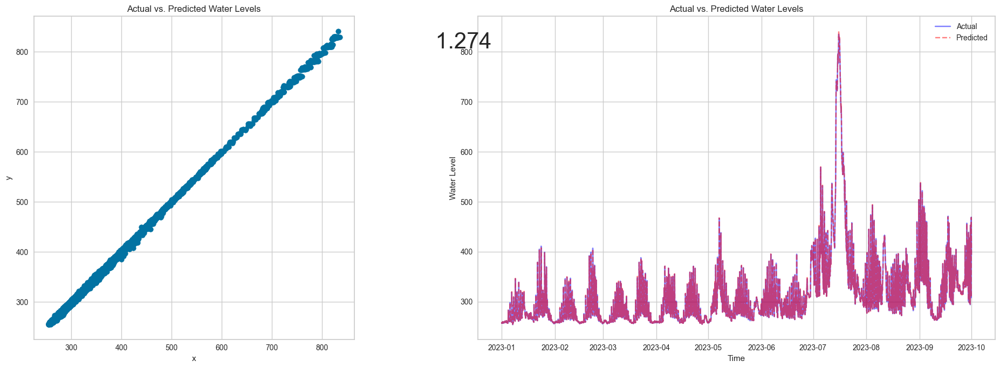

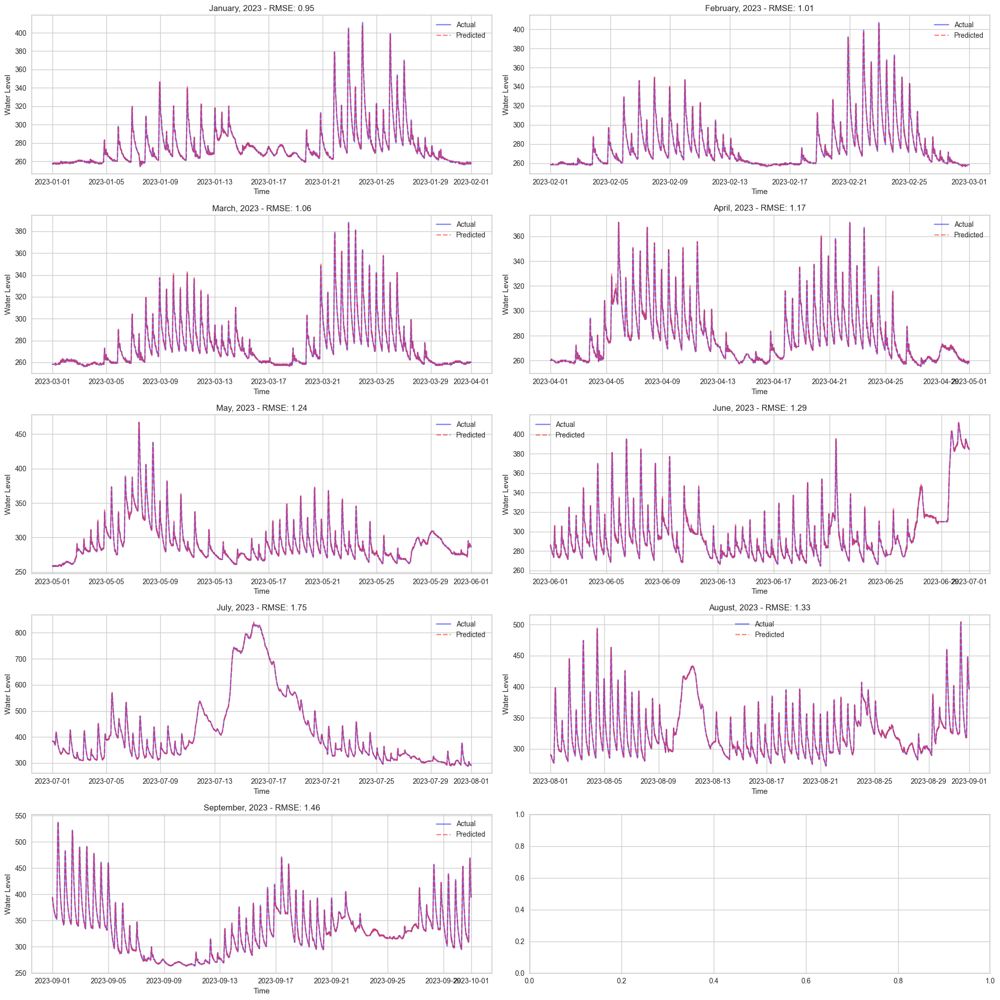

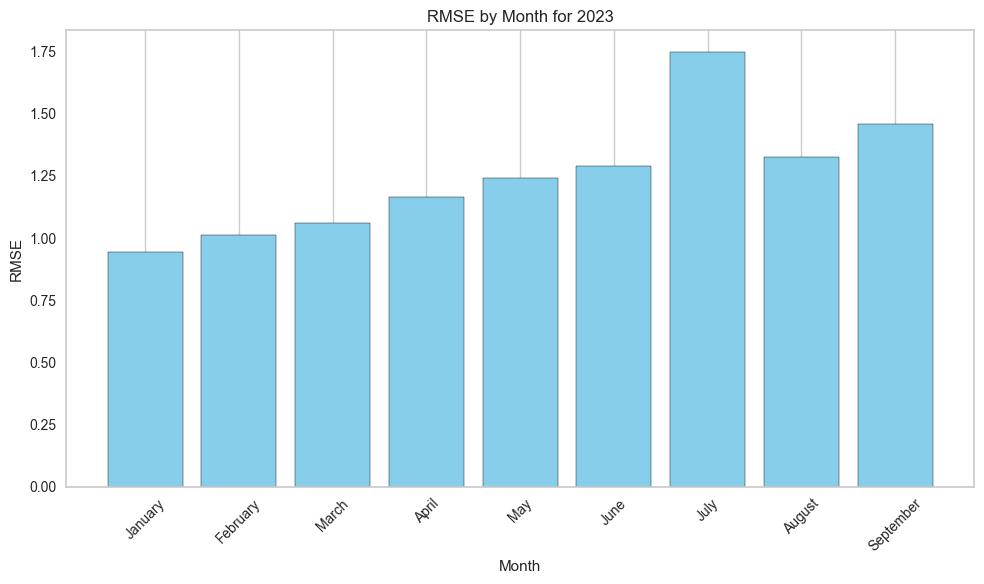

In [15]:
plot_compare(answer,leadtime_10_pred)
plot_month(answer,leadtime_10_pred,10)

## leadtime 30

In [16]:
leadtime_30_pred = predict_wl_level(ppd_data2, 30)

##################################################
Leadtime 30 predict start


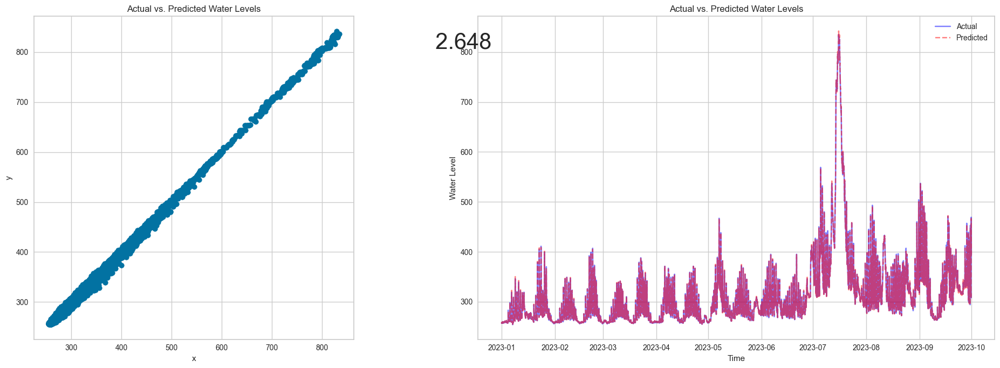

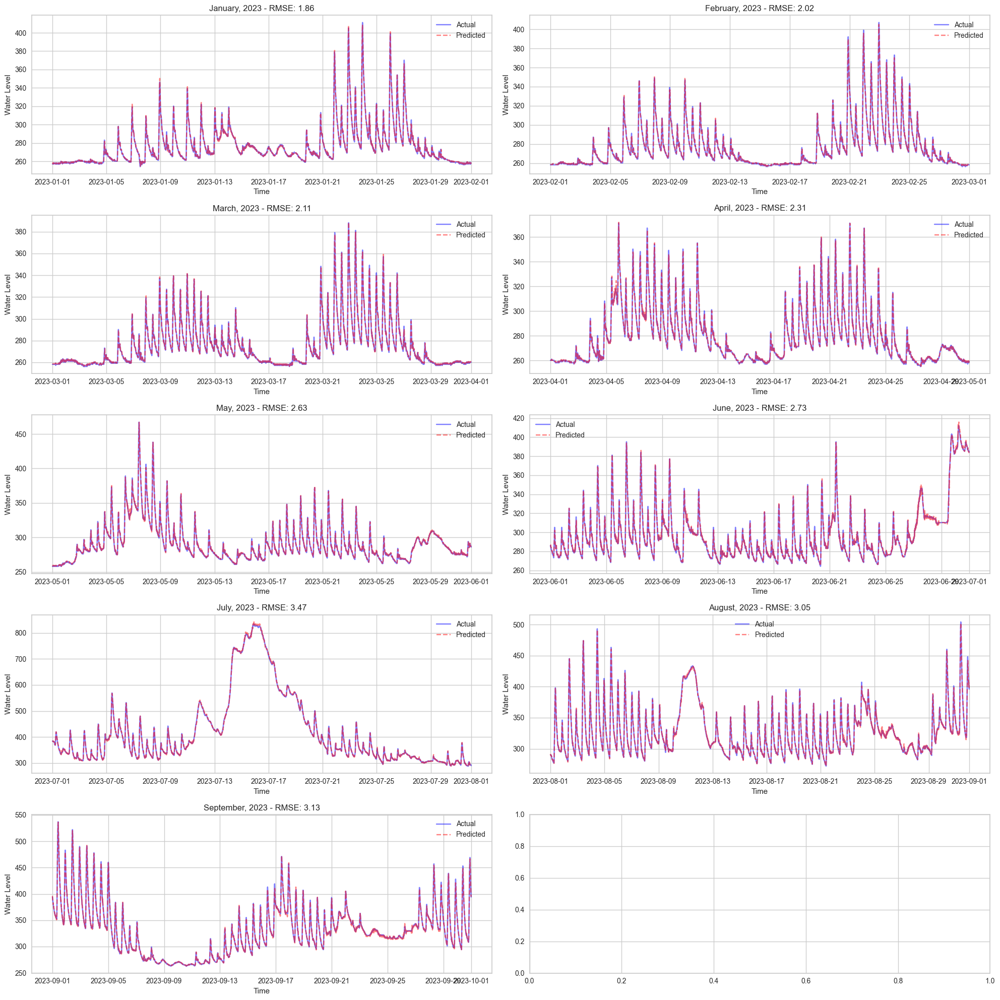

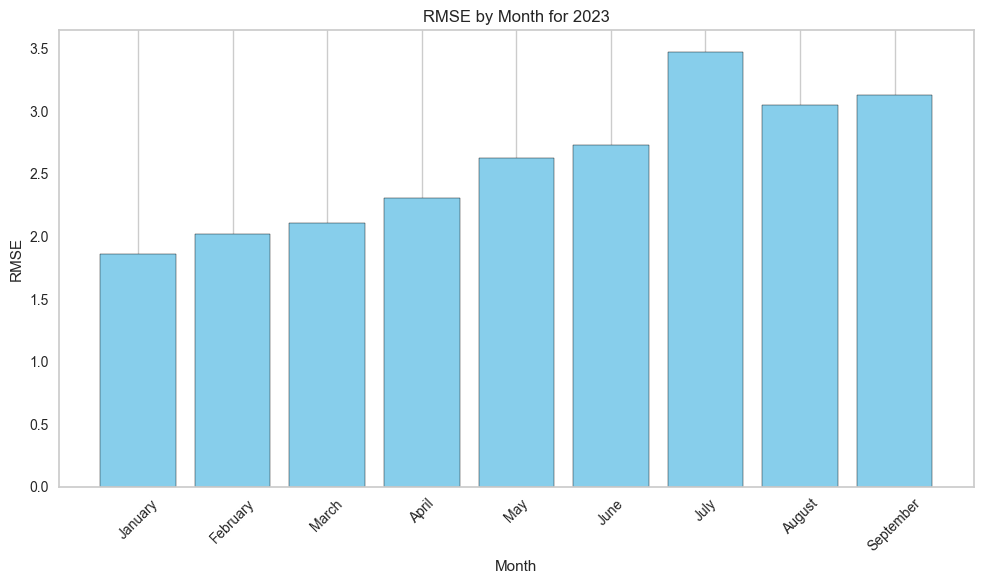

In [17]:
plot_compare(answer,leadtime_30_pred)
plot_month(answer,leadtime_30_pred,10)

## leadtime 60

In [18]:
leadtime_60_pred = predict_wl_level(ppd_data2, 60)

##################################################
Leadtime 60 predict start


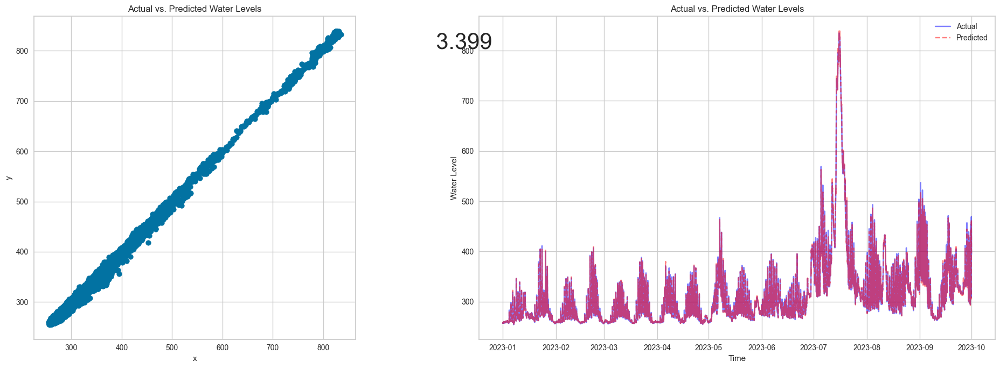

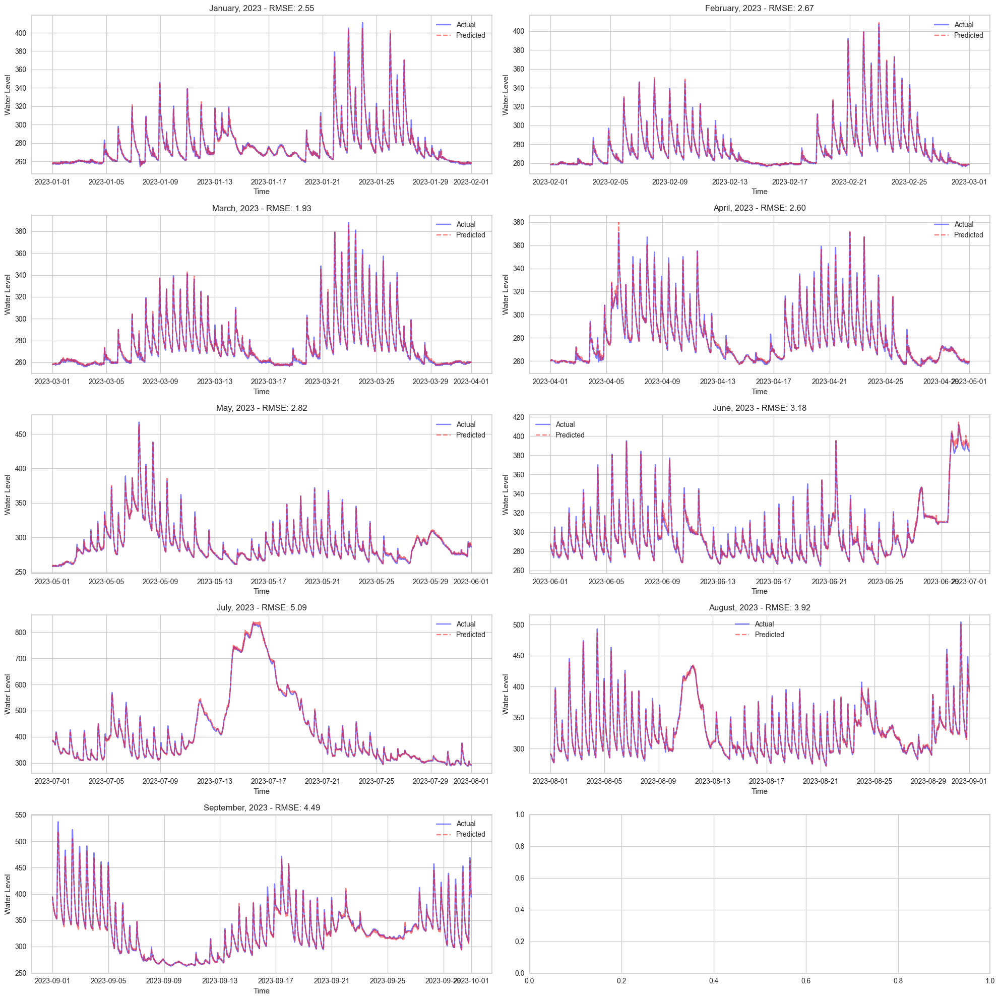

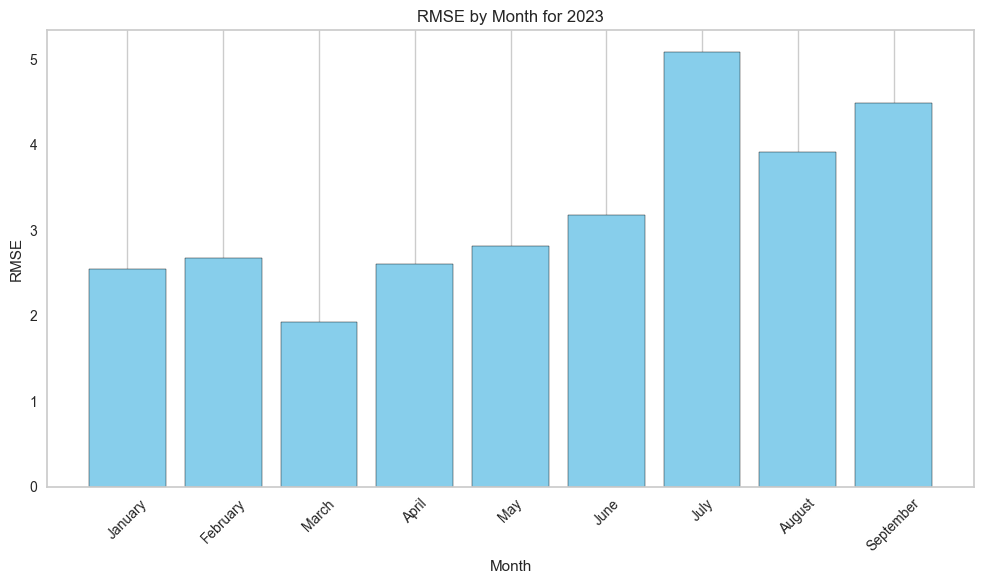

In [19]:
plot_compare(answer,leadtime_60_pred)
plot_month(answer,leadtime_60_pred,10)

## leadtime 180

In [20]:
leadtime_180_pred = predict_wl_level(ppd_data2, 180)

##################################################
Leadtime 180 predict start


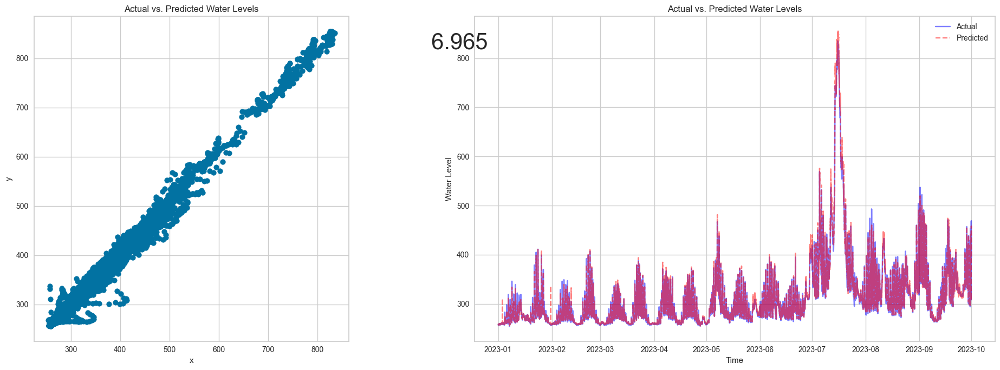

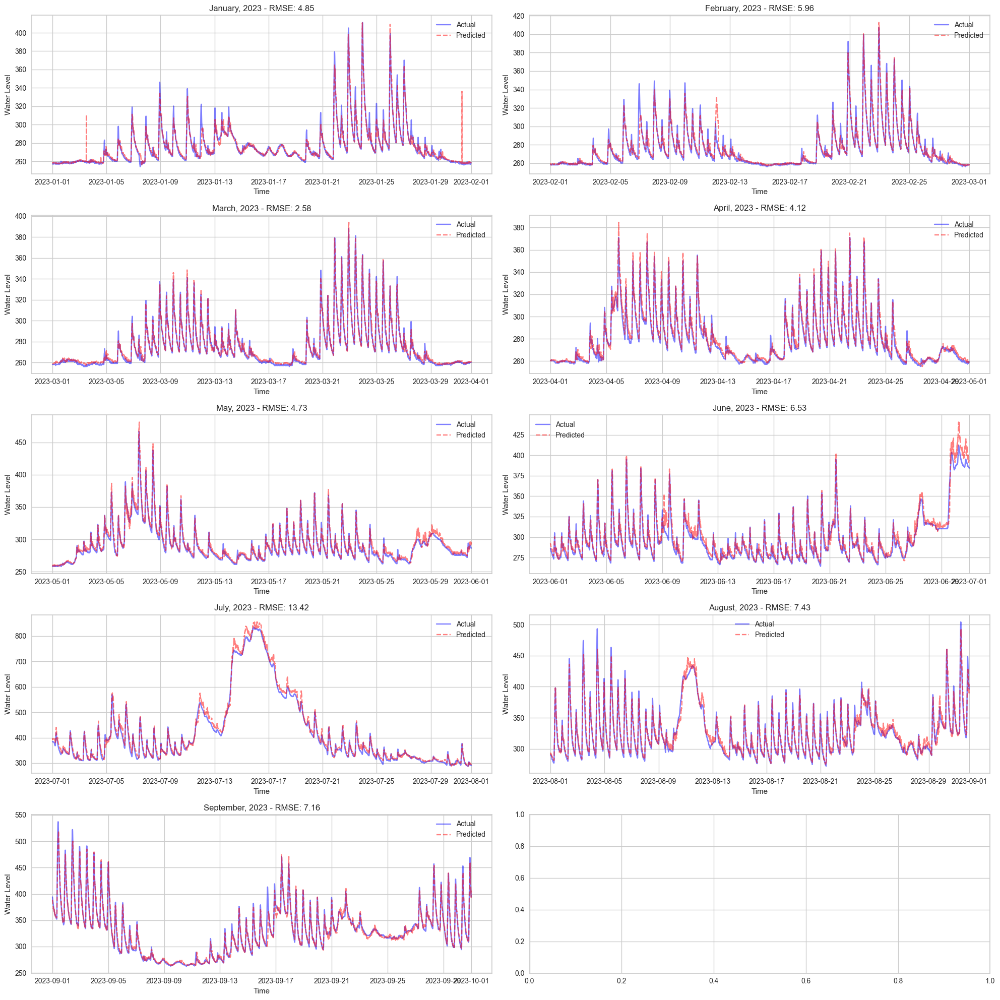

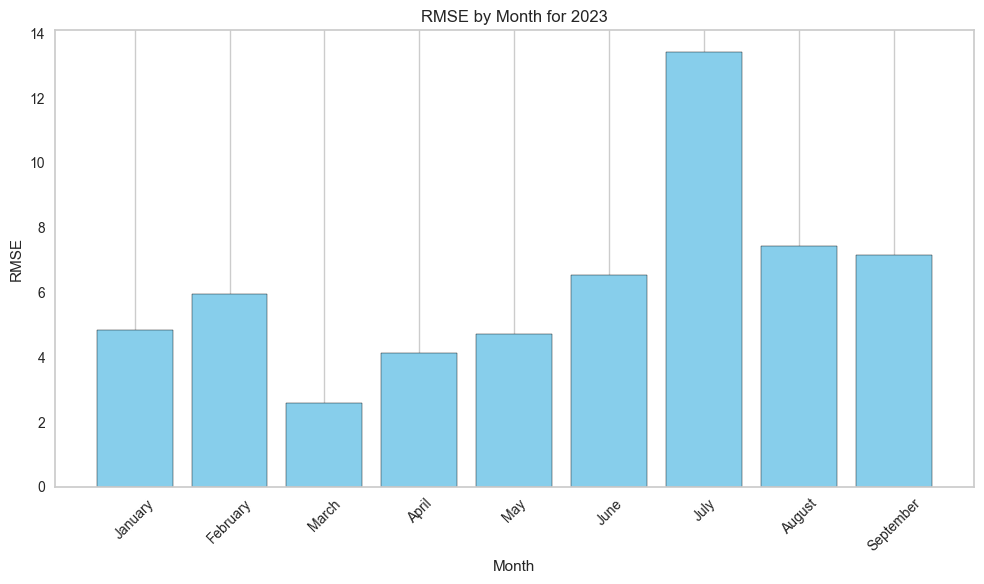

In [21]:
plot_compare(answer,leadtime_180_pred)
plot_month(answer,leadtime_180_pred,10)

## leadtime 360

In [22]:
leadtime_360_pred = predict_wl_level(ppd_data2, 360)

##################################################
Leadtime 360 predict start


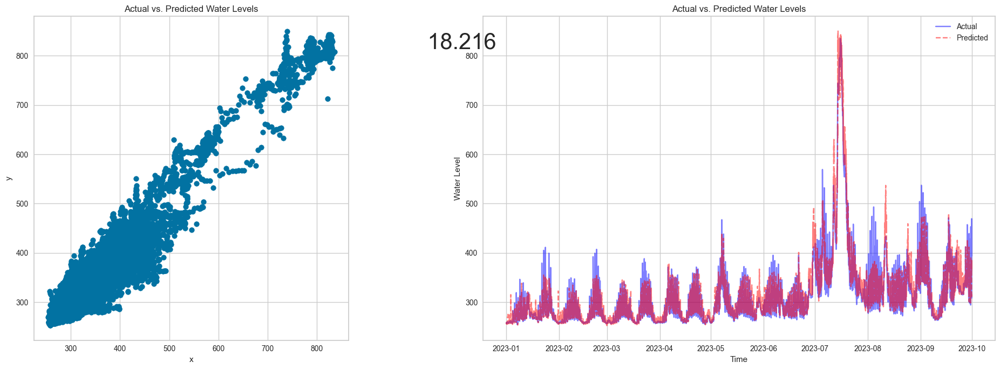

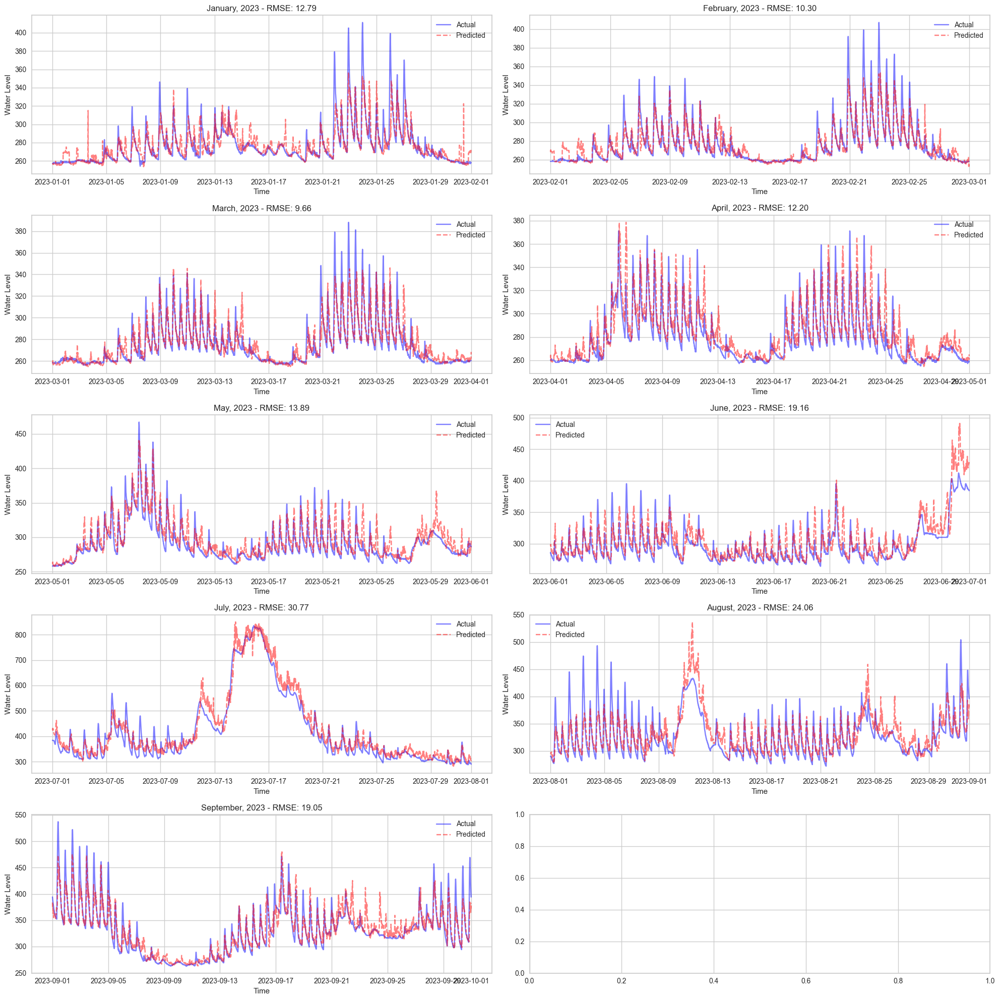

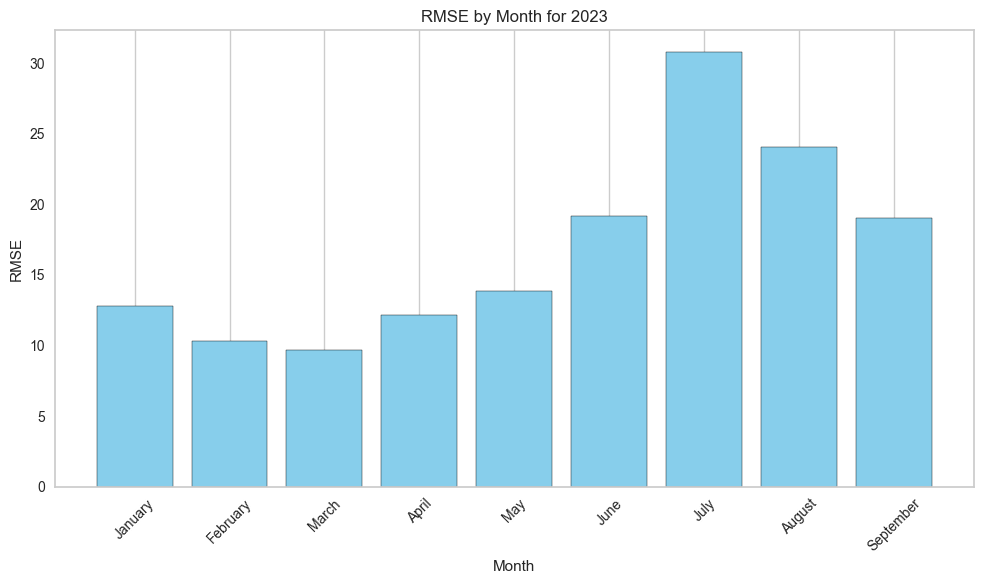

In [23]:
plot_compare(answer,leadtime_360_pred)
plot_month(answer,leadtime_360_pred,10)

# leadtime 540 

In [26]:
leadtime_540_pred = predict_wl_level(ppd_data2, 540)

##################################################
Leadtime 540 predict start
[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 2, number of used features: 0
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 3060 Ti, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 16 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Warning] GPU acceleration is disabled because no non-trivial dense features can be found
[LightGBM] [Info] Start training from score 0.500000
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the sp

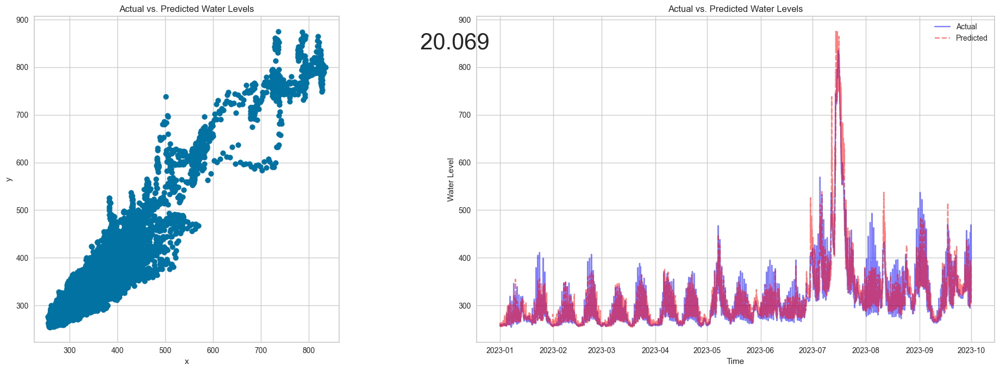

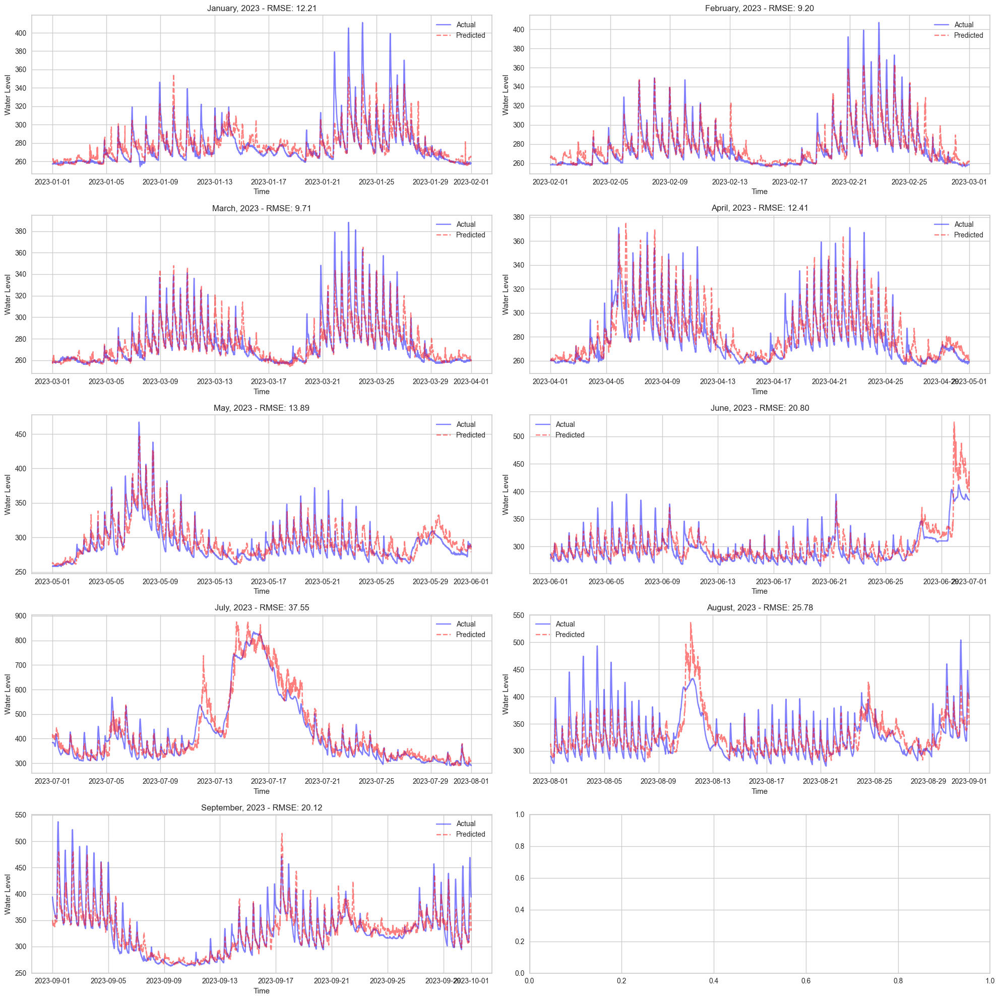

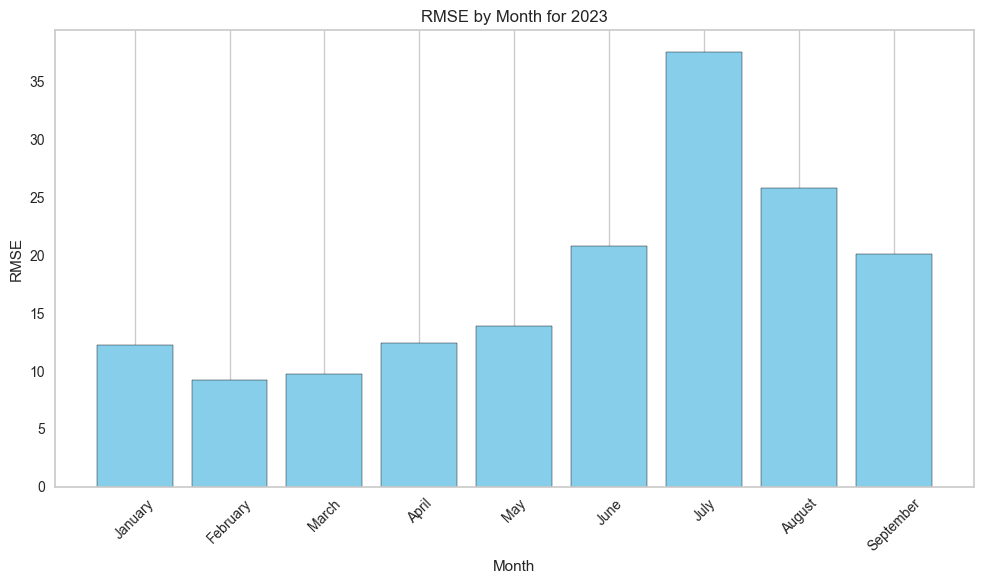

In [27]:
plot_compare(answer,leadtime_540_pred)
plot_month(answer,leadtime_540_pred,10)

# leadtime 720

In [28]:
leadtime_720_pred = predict_wl_level(ppd_data2, 720)

##################################################
Leadtime 720 predict start
[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 2, number of used features: 0
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 3060 Ti, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 16 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Warning] GPU acceleration is disabled because no non-trivial dense features can be found
[LightGBM] [Info] Start training from score 0.500000
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the sp

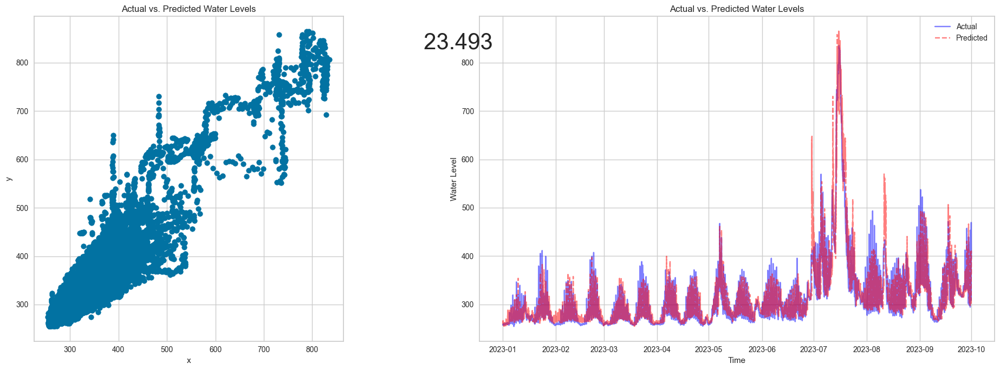

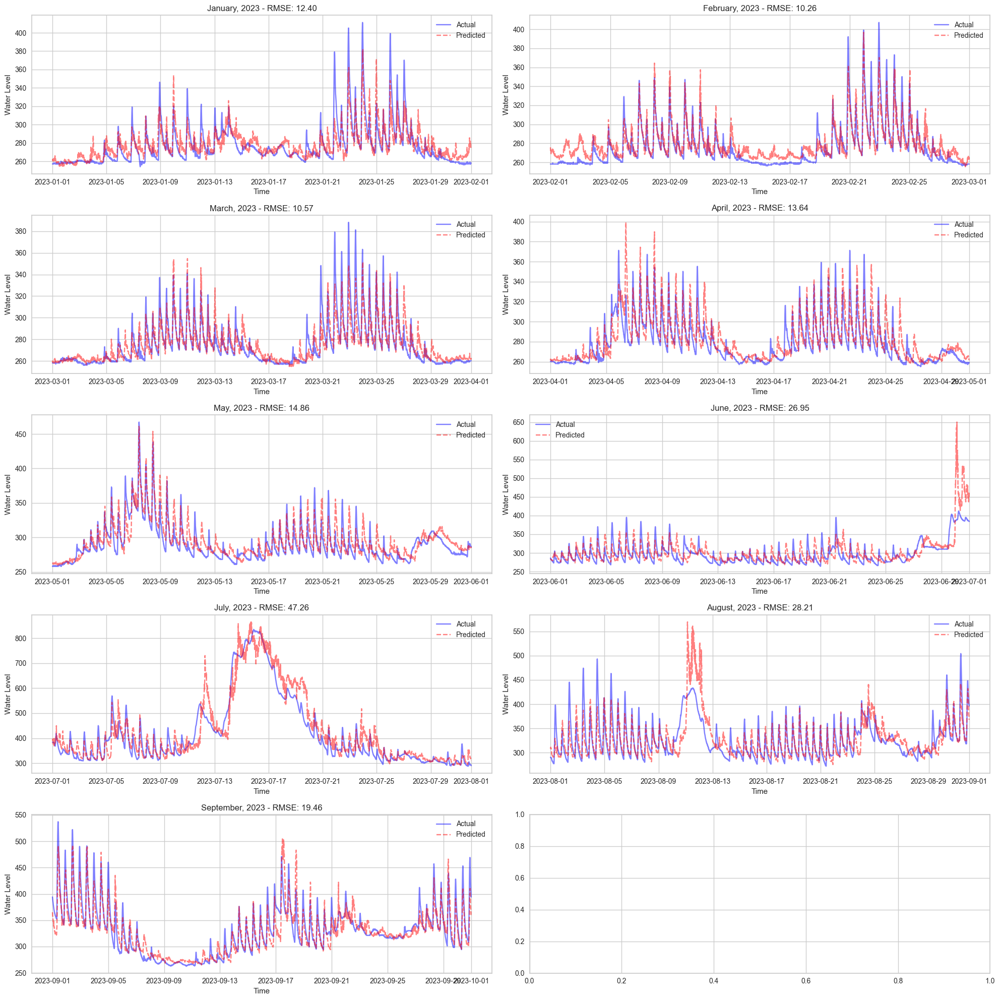

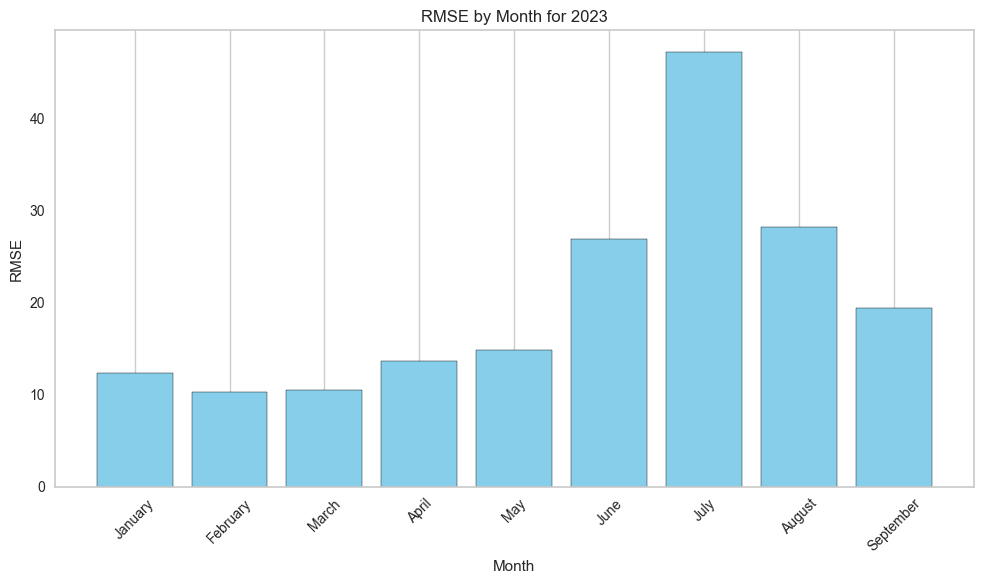

In [29]:
plot_compare(answer,leadtime_720_pred)
plot_month(answer,leadtime_720_pred,10)

# analyze

Transformation Pipeline and Model Successfully Loaded
Transformation Pipeline and Model Successfully Loaded
Transformation Pipeline and Model Successfully Loaded
Transformation Pipeline and Model Successfully Loaded
Transformation Pipeline and Model Successfully Loaded
Transformation Pipeline and Model Successfully Loaded
Transformation Pipeline and Model Successfully Loaded


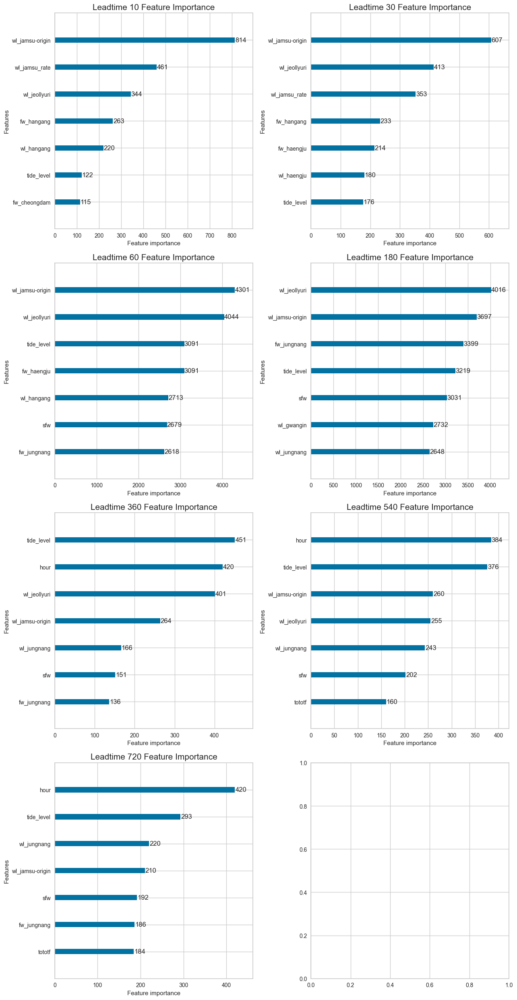

In [20]:
leadtime_list = [10, 30, 60, 180, 360, 540, 720]
max_n = 7

fig, axes = plt.subplots(4, 2, figsize=(13, 25))

for i, leadtime in enumerate(leadtime_list):
    row = i // 2
    col = i % 2
    ax = axes[row, col]
    feature_importance(leadtime, max_n)

plt.tight_layout()
plt.show();
fig.savefig(f'../image/feature_importance.png', bbox_inches='tight');


In [25]:
# 3개의 모델(전체월, 비홍수기, 홍수기)을 이용하여 test 셋의 rmse를 가장 잘 예측한 모델을 확인.

overall_rmse_list = []

for leadtime in leadtime_list:
    print("#" * 50)
    print(f"Predict report for Leadtime {leadtime}:\n")
    dataframes = [pd.read_csv(f"../result/leadtime({leadtime})/final_model-{model_num}.csv", index_col='ymdhm') for model_num in range(1, 4)]

    monthly_rmse_best = pd.DataFrame(index=range(1, 10), columns=['Model 1', 'Model 2', 'Model 3', 'Best Model'])

    for month in range(1, 10):
        best_rmse, best_model_name = float('inf'), None
        for i, model in enumerate(dataframes):
            model.index = pd.to_datetime(model.index)
            model_month = model[model.index.month == month]
            answer_month = answer[answer.index.month == month] 

            if not model_month.empty and not answer_month.empty:
                rmse = sqrt(mean_squared_error(answer_month, model_month))
                monthly_rmse_best.loc[month, f'Model {i+1}'] = rmse

                if rmse < best_rmse:
                    best_rmse, best_model_name = rmse, f'Model {i+1}'

        monthly_rmse_best.loc[month, 'Best Model'] = best_model_name

    print(monthly_rmse_best)

    # 각 월마다 가장 잘 예측한 모델의 rmse를 합침 .
    best_model_rmses = [monthly_rmse_best.loc[month, best_model] for month, best_model in enumerate(monthly_rmse_best['Best Model'], start=1)]
    overall_rmse = sqrt(np.mean(np.square(best_model_rmses)))
    overall_rmse_list.append(overall_rmse)

    print(f"Total RMSE for Leadtime {leadtime}: {overall_rmse}")


##################################################
Predict report for Leadtime 10:

    Model 1    Model 2   Model 3 Best Model
1  0.983904    0.94573  0.999782    Model 2
2  1.066816   1.013845  1.084902    Model 2
3   1.06171   1.040439  1.108066    Model 2
4  1.166875    1.13219  1.229553    Model 2
5  1.242112   1.233265   1.26584    Model 2
6  1.288122   1.306489  1.308411    Model 1
7  1.980046  16.385351  1.747656    Model 3
8  1.326638   1.550561  1.326978    Model 1
9  1.457691   1.729835  1.403951    Model 3
Total RMSE for Leadtime 10: 1.2584030733371139
##################################################
Predict report for Leadtime 30:

    Model 1    Model 2   Model 3 Best Model
1  1.938136    1.85741  2.121625    Model 2
2  2.140622   2.023602  2.470947    Model 2
3  2.105189   2.008012  2.290884    Model 2
4  2.307805   2.294055  2.470208    Model 2
5  2.626578   2.671462  2.699631    Model 1
6  2.734462    2.95625  2.872287    Model 1
7  3.568621  42.463196  3.472752    M